In [239]:
options(warn = -1)
suppressMessages(require(Seurat))
suppressMessages(require(ggplot2))
suppressMessages(require(dplyr))
suppressMessages(require(reticulate))
suppressMessages(require(stringr))
suppressMessages(require(ggpubr))
suppressMessages(require(tidydr))
suppressMessages(require(CellTrek))
suppressMessages(require(CARD))
devtools::load_all('../Cell2Spatial/')

ℹ Loading Cell2Spatial


In [240]:
source('modules/globalParams.R')
source('modules/utils.R')
source('modules/vis.R')
source('modules/reformatProjRes.R')

In [241]:
out.figs.dir <- '../2.results/COVID19/figs'
out.data.dir <- '../2.results/COVID19/data'

In [242]:
dir.create(out.figs.dir, showWarnings = FALSE, recursive = TRUE)
dir.create(out.data.dir, showWarnings = FALSE, recursive = TRUE)

In [243]:
MTH_COLOR <- c(
    'Reference'    = 'grey',
    'Cell2Spatial' = '#F7B263',
    'CytoSPACE' = '#D6AA8E',
    'CellTrek' = '#99C0CC',
    'Tangram' = 'lightgreen',
    'Seurat' = '#CC00FF'
)

### Loading kidney ST and SC datasets 

In [244]:
brain.st <- readRDS('../0.data/COVID19/COVID19_SP.RDS')

In [245]:
brain.sc <- readRDS('../0.data/COVID19/COVID19_SC.RDS')

In [246]:
brain.st <- brain.st %>% SCTransform(., verbose = FALSE, assay = 'Spatial') %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE) %>%
    FindNeighbors(., dims = 1:30, verbose = FALSE) %>%
    FindClusters(., verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



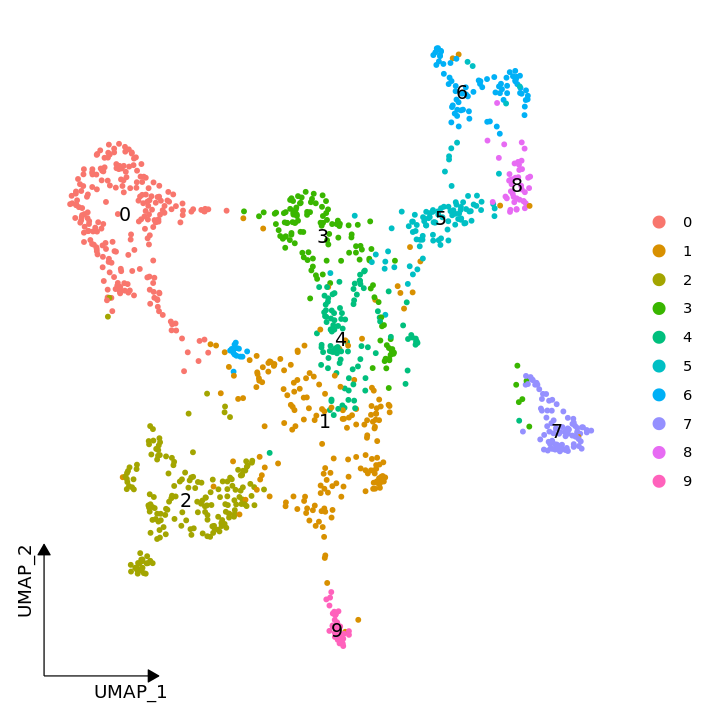

In [247]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.st, reduction = "umap", label = TRUE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank())
ggsave(file.path(out.figs.dir, 'COVID19.ST.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

Scale for fill is already present.
Adding another scale for fill, which will replace the existing scale.


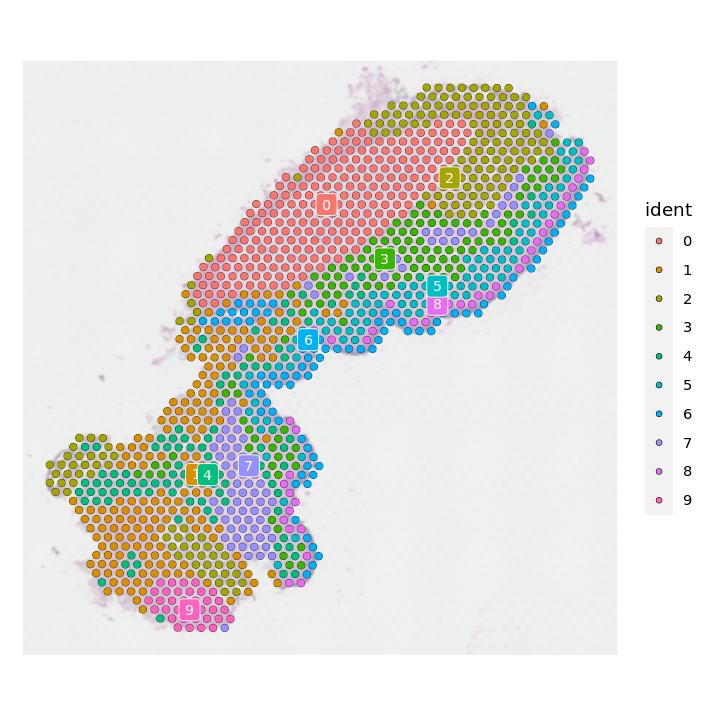

In [248]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = TRUE, label.size = 3, image.alpha = 0.5)
ggsave(file.path(out.figs.dir, 'COVID19.ST.cluster.UMAP.spatial.pdf'), width = 6, height = 6)

In [249]:
f.ctypes <- levels(brain.st)
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(brain.st, idents = ct) %>% Cells
    SpatialPlot(brain.st, cells.highlight = h.cells) + NoLegend() + ggtitle(ct) 
})

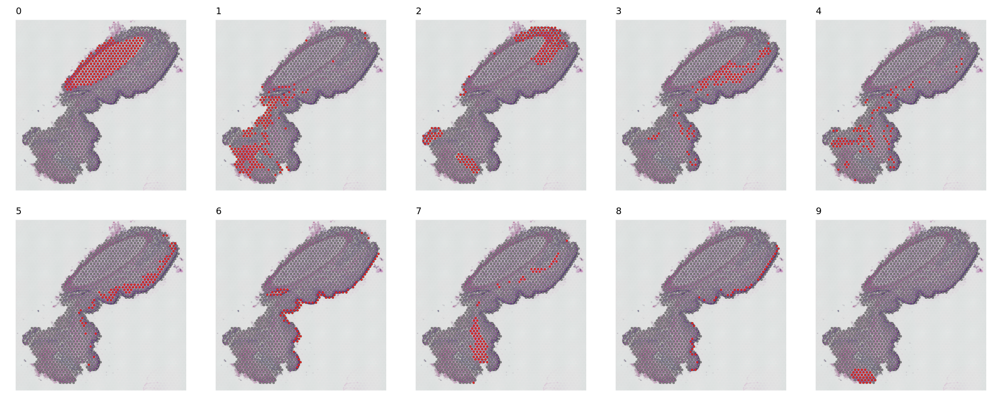

In [250]:
options(repr.plot.width = 20, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 5)

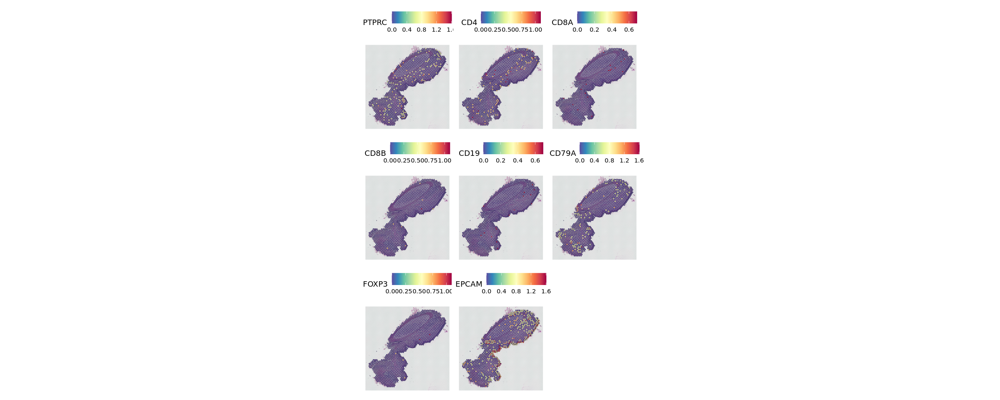

In [251]:
options(repr.plot.width = 20, repr.plot.height = 8)
SpatialFeaturePlot(brain.st, features = c('PTPRC', 'CD4', 'CD8A', 'CD8B', 'CD19', 'CD79A', 'PEP', 'FOXP3', 'EPCAM'))

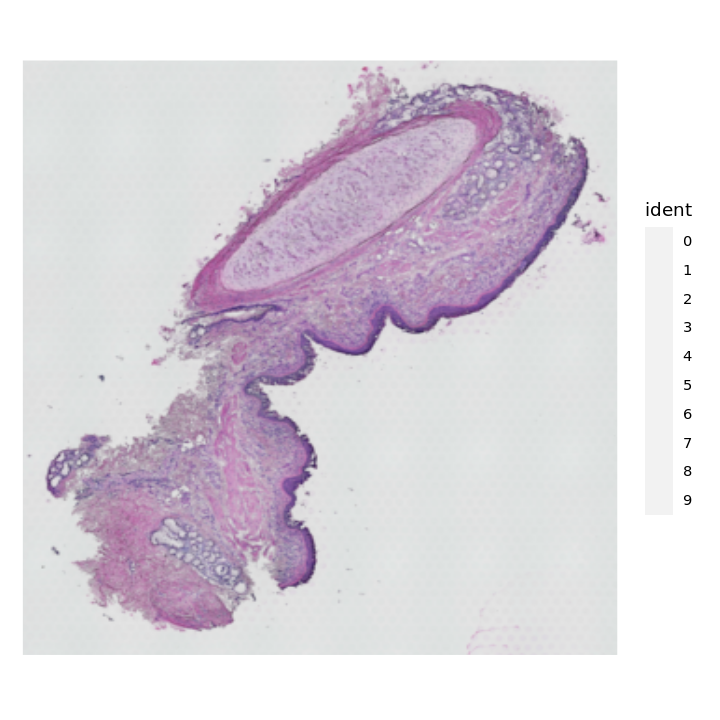

In [252]:
options(repr.plot.width = 6, repr.plot.height = 6)
SpatialDimPlot(brain.st, label = FALSE, label.size = 3,, alpha = 0)
ggsave(file.path(out.figs.dir, 'COVID19.ST.Image.spatial.pdf'), width = 6, height = 6)

In [349]:
dim(brain.sc)

[1]  31604 116313

In [253]:
brain.st@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,SCT_snn_res.0.8,seurat_clusters
,<fct>,<dbl>,<int>,<dbl>,<int>,<fct>,<fct>
AAACAGAGCGACTCCT-1,SeuratProject,4567,2265,4491,2258,3,3
AAACAGGGTCTATATT-1,SeuratProject,47816,6792,4485,1316,2,2
AAACCGGGTAGGTACC-1,SeuratProject,5088,2418,4756,2393,1,1
AAACCGTTCGTCCAGG-1,SeuratProject,6143,2743,5146,2734,7,7
AAACTTGCAAACGTAT-1,SeuratProject,6093,2189,5000,2183,2,2
AAAGGCTCTCGCGCCG-1,SeuratProject,17169,5699,4763,2489,8,8


In [254]:
brain.sc@meta.data %>% head

,orig.ident,nCount_RNA,nFeature_RNA,NAME,biosample_id,donor_id,species,species__ontology_label,disease,disease__ontology_label,⋯,cell_type_intermediate,cell_type_fine,initial_clustering,age,sex,recorded_race,recorded_ethnicity,intubation_days,interval_death_symptoms_onset_days,pmi_h
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ATTCACTGTAACAGGC-1_1,COVID19,4992.134,6686,ATTCACTGTAACAGGC-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,PATO:0000461,normal,⋯,Airway epithelial cells,Airway ciliated,18,70,female,White,not_hispanic,NA,NA,NA
TAACTTCCAACCACGC-1_1,COVID19,4507.102,5158,TAACTTCCAACCACGC-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,PATO:0000461,normal,⋯,Macrophages,Alveolar macrophages,3,70,female,White,not_hispanic,NA,NA,NA
TTGGGTACACGACAAG-1_1,COVID19,4336.390,4900,TTGGGTACACGACAAG-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,PATO:0000461,normal,⋯,Airway epithelial cells,Airway ciliated,18,70,female,White,not_hispanic,NA,NA,NA
AGGCCACAGAGTCACG-1_1,COVID19,4825.336,5544,AGGCCACAGAGTCACG-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,PATO:0000461,normal,⋯,Airway epithelial cells,Airway ciliated,18,70,female,White,not_hispanic,NA,NA,NA
CACTGAAGTCGAAGCA-1_1,COVID19,4842.295,5487,CACTGAAGTCGAAGCA-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,PATO:0000461,normal,⋯,Airway epithelial cells,Airway ciliated,18,70,female,White,not_hispanic,NA,NA,NA
ACTGATGTCTGCACCT-1_1,COVID19,4206.603,4411,ACTGATGTCTGCACCT-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,PATO:0000461,normal,⋯,AT1,AT1,5,70,female,White,not_hispanic,NA,NA,NA


In [255]:
Idents(brain.sc) <- brain.sc$cell_type_intermediate

In [256]:
options(future.globals.maxSize = 5000000 * 1024^2, future.seed = TRUE)

brain.sc <- SCTransform(brain.sc, ncells = 3000, verbose = FALSE) %>%
    RunPCA(verbose = FALSE) %>%
    RunUMAP(dims = 1 : 30, verbose = FALSE)

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [257]:
set.seed(2023063)
cell.colors <- randomcoloR::distinctColorPalette(length(unique(brain.sc$cell_type_intermediate))) %>% `names<-`(unique(brain.sc$cell_type_intermediate))

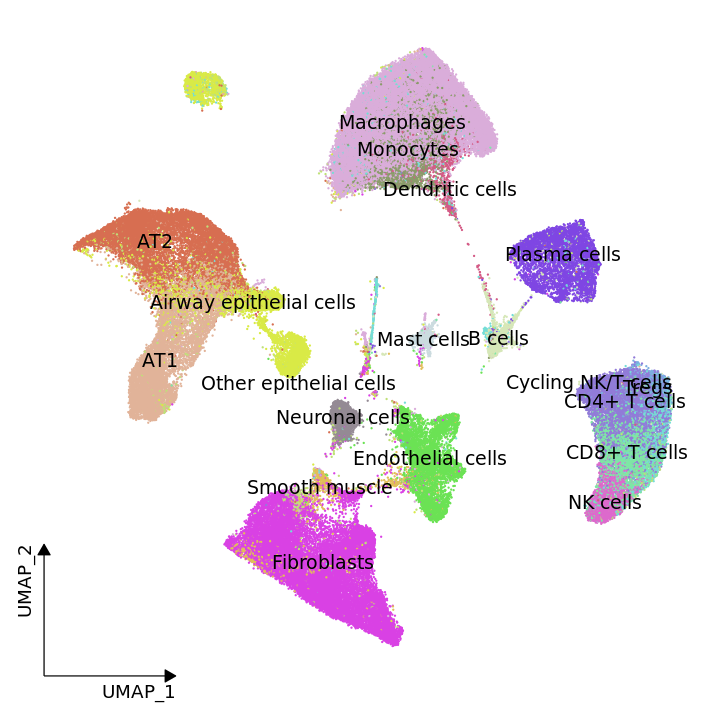

In [258]:
options(repr.plot.width = 6, repr.plot.height = 6)
DimPlot(brain.sc, label = TRUE, cols = cell.colors, raster=FALSE) + theme_dr(xlength = 0.2, ylength = 0.2, arrow = grid::arrow(length = unit(0.1, "inches"), ends = 'last', type = "closed")) + theme(panel.grid = element_blank()) + NoLegend()
ggsave(file.path(out.figs.dir, 'COVID19.SC.cluster.UMAP.dimplot.pdf'), width = 6, height = 6)

In [259]:
levels(brain.sc) %>% length

[1] 19

In [321]:
markers <- FindAllMarkers(brain.sc, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

Calculating cluster Airway epithelial cells

Calculating cluster Macrophages

Calculating cluster AT1

Calculating cluster Smooth muscle

Calculating cluster AT2

Calculating cluster Fibroblasts

Calculating cluster Dendritic cells

Calculating cluster Cycling NK/T cells

Calculating cluster Endothelial cells

Calculating cluster Other epithelial cells

Calculating cluster Mast cells

Calculating cluster Neuronal cells

Calculating cluster Plasma cells

Calculating cluster Monocytes

Calculating cluster NK cells

Calculating cluster CD4+ T cells

Calculating cluster B cells

Calculating cluster Tregs

Calculating cluster CD8+ T cells



In [261]:
#openxlsx::write.xlsx(markers, file = file.path(out.data.dir, 'Thymus.ST.markers.xlsx'))

In [262]:
#top20.markers <- markers %>% group_by(cluster) %>% top_n(n = 50, wt = avg_log2FC)

In [263]:
#saveRDS(brain.sc, file = file.path(out.data.dir, 'brain.sc.RDS'))
#saveRDS(brain.st, file = file.path(out.data.dir, 'brain.st.RDS'))

### Showing the projection performance for Cell2Spatial

In [293]:
cell2spatial <- readRDS('../2.results/COVID19/data/COVID19.cell2spatial.RDS')$obj

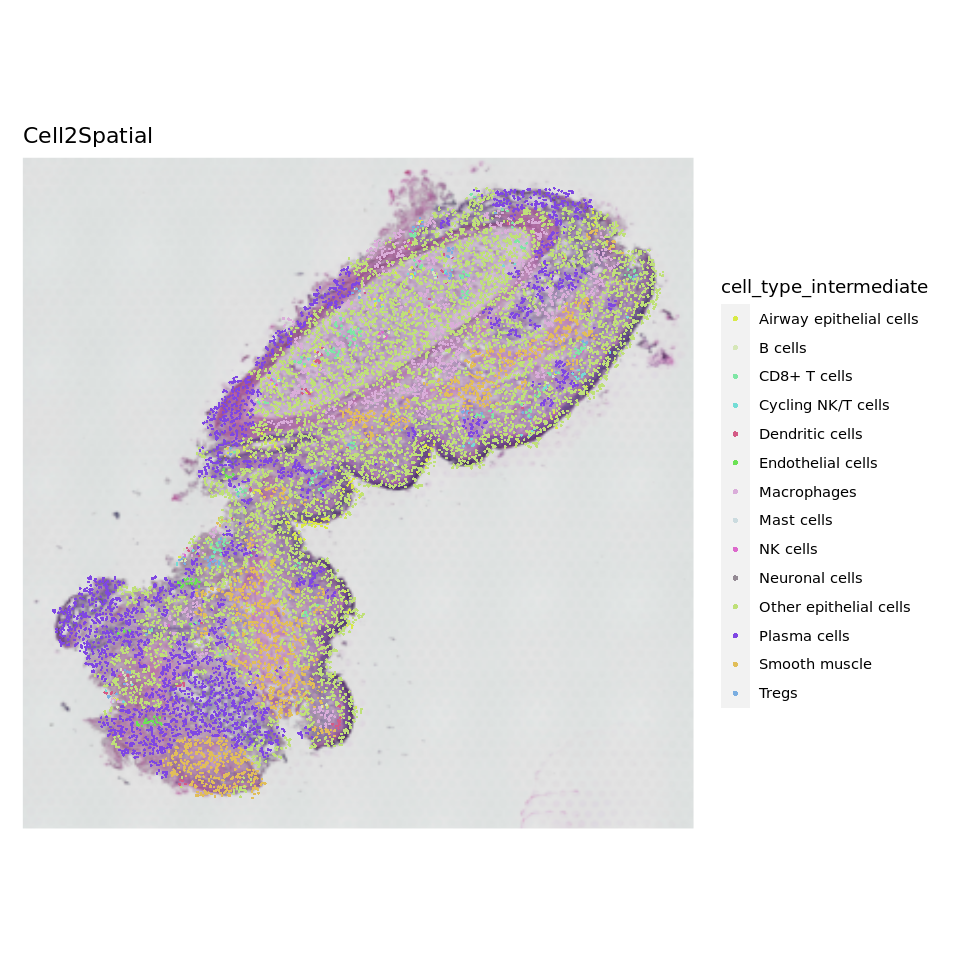

In [318]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell2spatial, group.by = 'cell_type_intermediate', pt.size = 0.5, image.alpha = 1, stroke = 0, cols = cell.colors) + ggtitle('Cell2Spatial')
ggsave(file.path(out.figs.dir, 'cell2spatial.entire.UMAP.pdf'), width = 8, height = 6)

In [315]:
length(cell2spatial$CellType %>% unique)

[1] 14

In [319]:
f.ctypes <- cell2spatial$CellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell2spatial, CellType == ct) %>% Cells
    obj.sub <- cell2spatial[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'CellType',  pt.size.factor = 0.6, crop = FALSE, stroke = 0, cols = cell.colors[ct]) + ggtitle(ct) + NoLegend()  
})

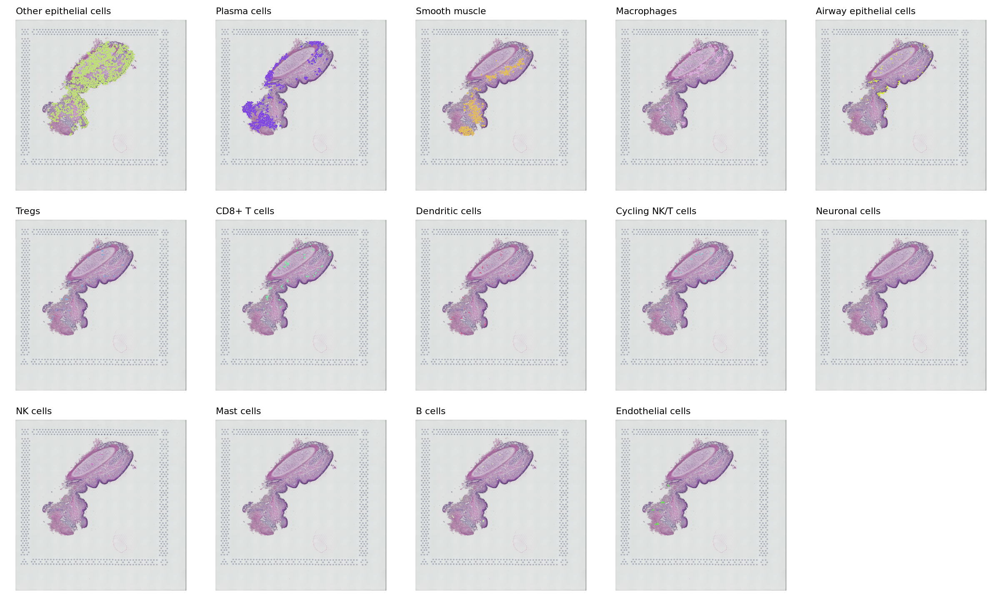

In [320]:
options(repr.plot.width = 20, repr.plot.height = 12)
ggarrange(plotlist = gps, nrow = 3, ncol = 5)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.pdf'), width = 20, height = 12)
ggsave(file.path(out.figs.dir, 'cell2spatial.split.UMAP.eps'), width = 20, height = 12)

### Showing the projection performance for CytoSpace

In [297]:
cytospace <- forCytoSpace('../2.results/COVID19/data/cytospace/', brain.sc, brain.st)

In [270]:
head(cytospace@meta.data)

,orig.ident,nCount_Spatial,nFeature_Spatial,UniqueCID,OriginalCID,CellType,SpotID,row,col,x.new,y.new
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
UCID0000,Cell2Spatial,1735,530,UCID0000,AGGCCACTCCTAGCTC-1_5,Smooth muscle,GTAATCTGATTCTTCG-1,334.0689,191.0119,336.2927,192.2907
UCID0001,Cell2Spatial,1936,624,UCID0001,GACCAATGTCCGGCAT-1_24,Smooth muscle,CGAGCTGGGCTTTAGG-1,154.0366,264.1550,152.0300,263.1058
UCID0002,Cell2Spatial,1689,1360,UCID0002,TTACGTTGTACCACGC-1_3,Smooth muscle,CACATCGTGCACGCGC-1,388.4823,171.9591,389.3844,172.4072
UCID0003,Cell2Spatial,1686,313,UCID0003,TGTCCACTCCTTTGAT-1_7,Smooth muscle,TGAGTGCCTCTTAAAT-1,306.6200,181.8084,304.8229,180.6442
UCID0004,Cell2Spatial,1669,756,UCID0004,GTTAGTGGTGCATTAC-1_4,Smooth muscle,GTTACTTTGGGCCTAG-1,295.8020,213.1324,293.4566,214.2490
UCID0005,Cell2Spatial,2369,2253,UCID0005,GGAATGGTCACCTTAT-1_21,Smooth muscle,TCTAGCAATCTCCGCC-1,311.9484,147.2551,309.0472,146.4565


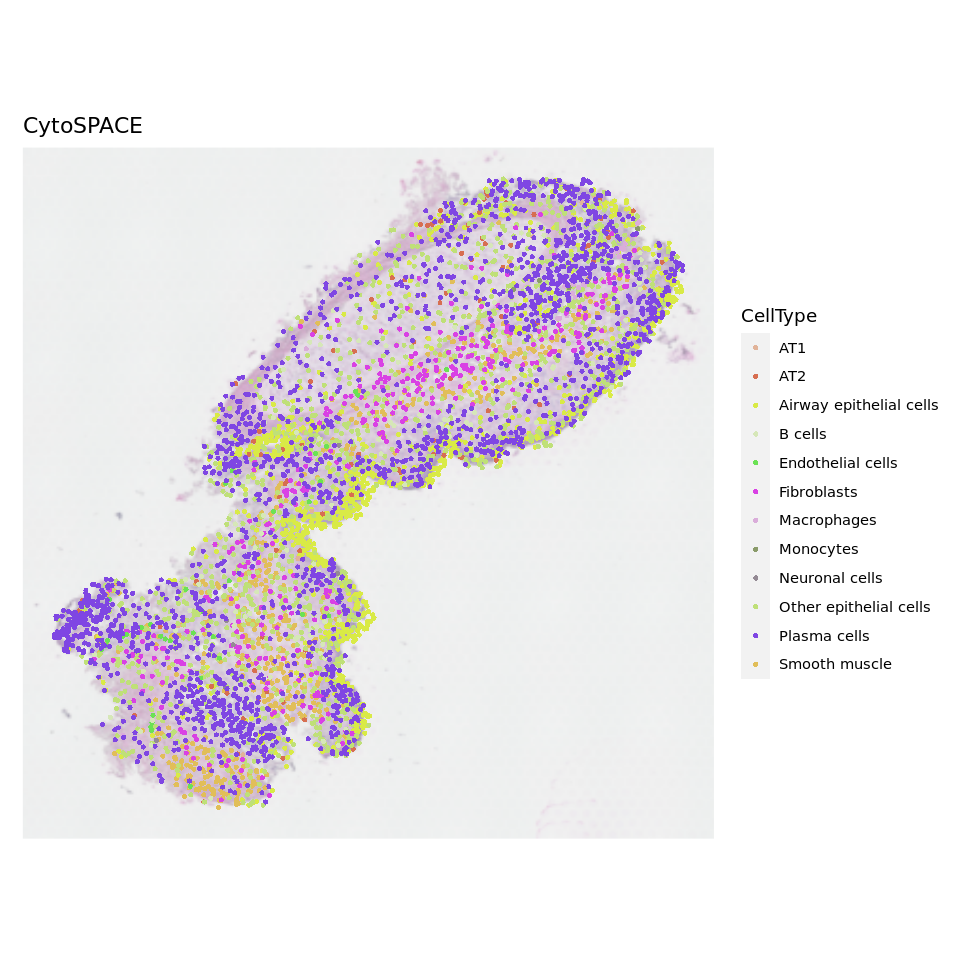

In [271]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cytospace, group.by = 'CellType', pt.size = 0.9, image.alpha = 0.5, cols = cell.colors, stroke = 0) + ggtitle('CytoSPACE')
ggsave(file.path(out.figs.dir, 'cytospace.entire.UMAP.pdf'), width = 8, height = 6)

In [272]:
length(cytospace$CellType %>% unique)

[1] 12

In [273]:
f.ctypes <- cytospace$CellType %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cytospace, CellType == ct) %>% Cells
    obj.sub <- cytospace[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'CellType', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

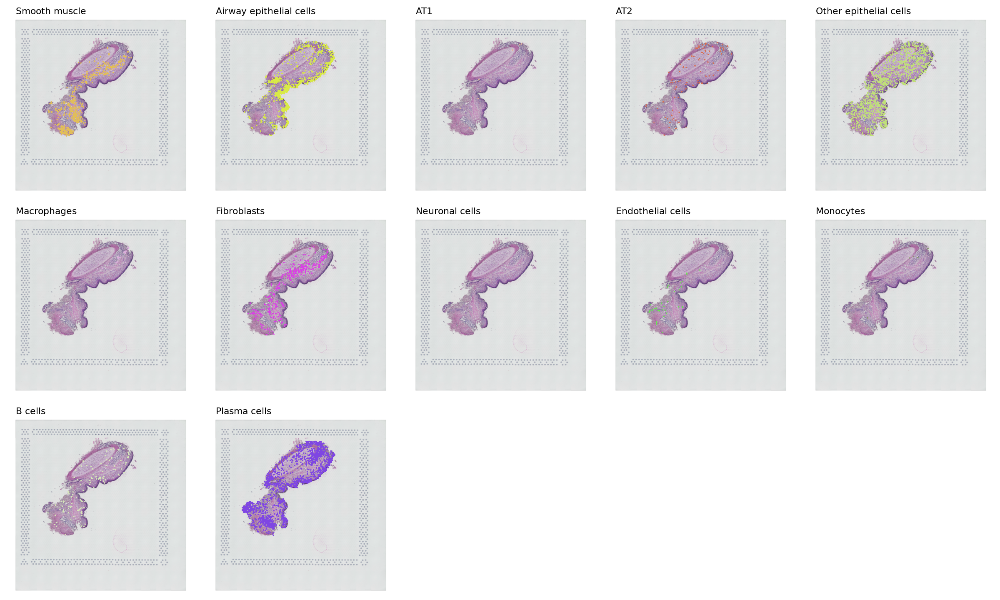

In [274]:
options(repr.plot.width = 20, repr.plot.height = 12)
ggarrange(plotlist = gps, nrow = 3, ncol = 5)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.pdf'), width = 20, height = 12)
ggsave(file.path(out.figs.dir, 'cytospace.split.UMAP.eps'), width = 20, height = 12)

### Showing the projection performance for tangram

In [298]:
tangram <- forTangram('../2.results/COVID19/data/COVID19_tangram.xls', brain.sc, brain.st)

In [276]:
tangram@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,X,nCount_RNA,nFeature_RNA,NAME,biosample_id,donor_id,species,⋯,recorded_race,recorded_ethnicity,intubation_days,interval_death_symptoms_onset_days,pmi_h,SpotID,row,col,x.new,y.new
,<int>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<int>,<int>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ATTCACTGTAACAGGC-1_1,0,821,806,ATTCACTGTAACAGGC-1_1,4992.134,6686,ATTCACTGTAACAGGC-1_1,C51ctr,C51ctr,NCBITaxon:9606,⋯,White,not_hispanic,NA,NA,NA,GGTAACCGGGAGGATA-1,372.0129,137.4058,374.7117,138.9578
TAACTTCCAACCACGC-1_1,0,1198,1163,TAACTTCCAACCACGC-1_1,4507.102,5158,TAACTTCCAACCACGC-1_1,C51ctr,C51ctr,NCBITaxon:9606,⋯,White,not_hispanic,NA,NA,NA,GCGTCGAAATGTCGGT-1,154.0366,257.8579,151.9688,256.7767
TTGGGTACACGACAAG-1_1,0,1188,1162,TTGGGTACACGACAAG-1_1,4336.390,4900,TTGGGTACACGACAAG-1_1,C51ctr,C51ctr,NCBITaxon:9606,⋯,White,not_hispanic,NA,NA,NA,TCTTACCGGAACTCGT-1,176.3186,339.3972,177.9946,340.2297
AGGCCACAGAGTCACG-1_1,0,949,932,AGGCCACAGAGTCACG-1_1,4825.336,5544,AGGCCACAGAGTCACG-1_1,C51ctr,C51ctr,NCBITaxon:9606,⋯,White,not_hispanic,NA,NA,NA,GTCACAAAGTTTCCAA-1,110.2799,245.5867,108.7240,244.5788
CACTGAAGTCGAAGCA-1_1,0,975,961,CACTGAAGTCGAAGCA-1_1,4842.295,5487,CACTGAAGTCGAAGCA-1_1,C51ctr,C51ctr,NCBITaxon:9606,⋯,White,not_hispanic,NA,NA,NA,GGGACAGAGTTACTCC-1,371.8515,112.3789,370.7883,112.8851
ACTGATGTCTGCACCT-1_1,0,1277,1227,ACTGATGTCTGCACCT-1_1,4206.603,4411,ACTGATGTCTGCACCT-1_1,C51ctr,C51ctr,NCBITaxon:9606,⋯,White,not_hispanic,NA,NA,NA,AAATGGCATGTCTTGT-1,132.2390,270.6136,130.6387,270.1731


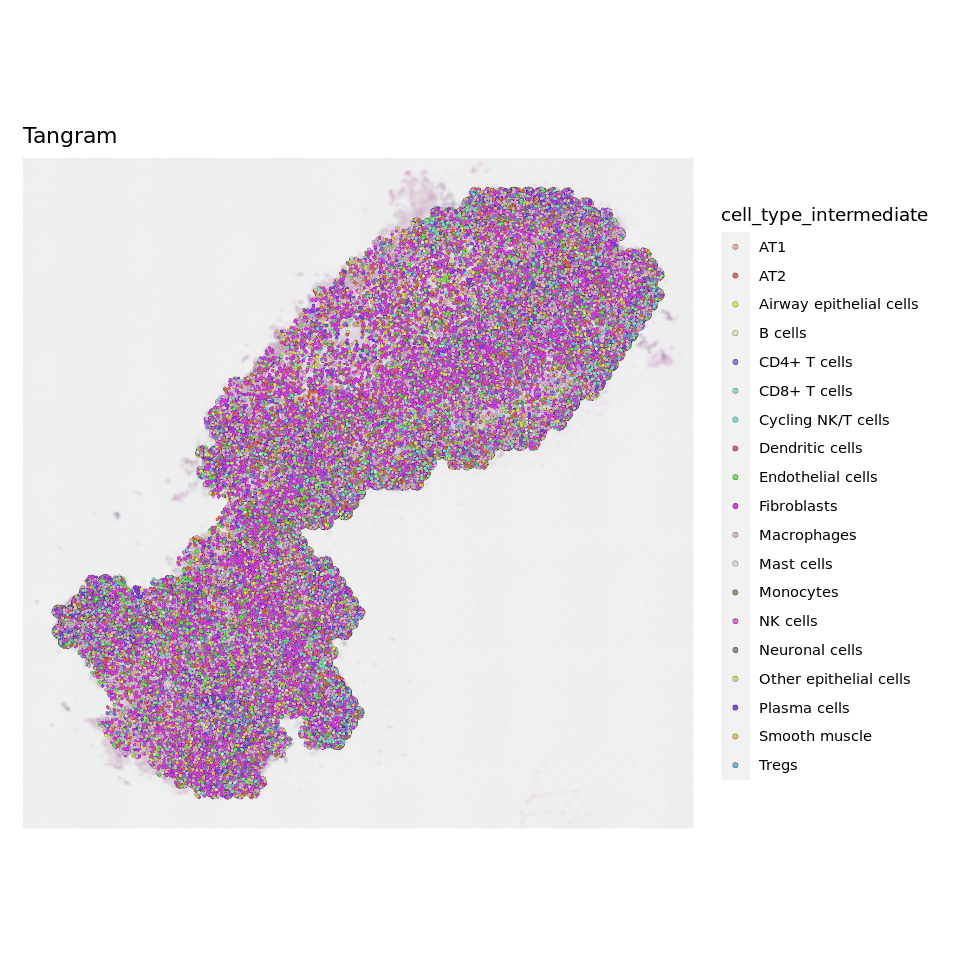

In [277]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(tangram, group.by = 'cell_type_intermediate', pt.size = 0.6, image.alpha = 0.5, cols = cell.colors, stroke = 0.1) + ggtitle('Tangram')
ggsave(file.path(out.figs.dir, 'tangram.entire.UMAP.pdf'), width = 8, height = 6)

In [278]:
length(f.ctypes <- tangram$cell_type_intermediate %>% unique)

[1] 19

In [279]:
f.ctypes <- tangram$cell_type_intermediate %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(tangram, cell_type_intermediate == ct) %>% Cells
    obj.sub <- tangram[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 0.5, group.by = 'cell_type_intermediate', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

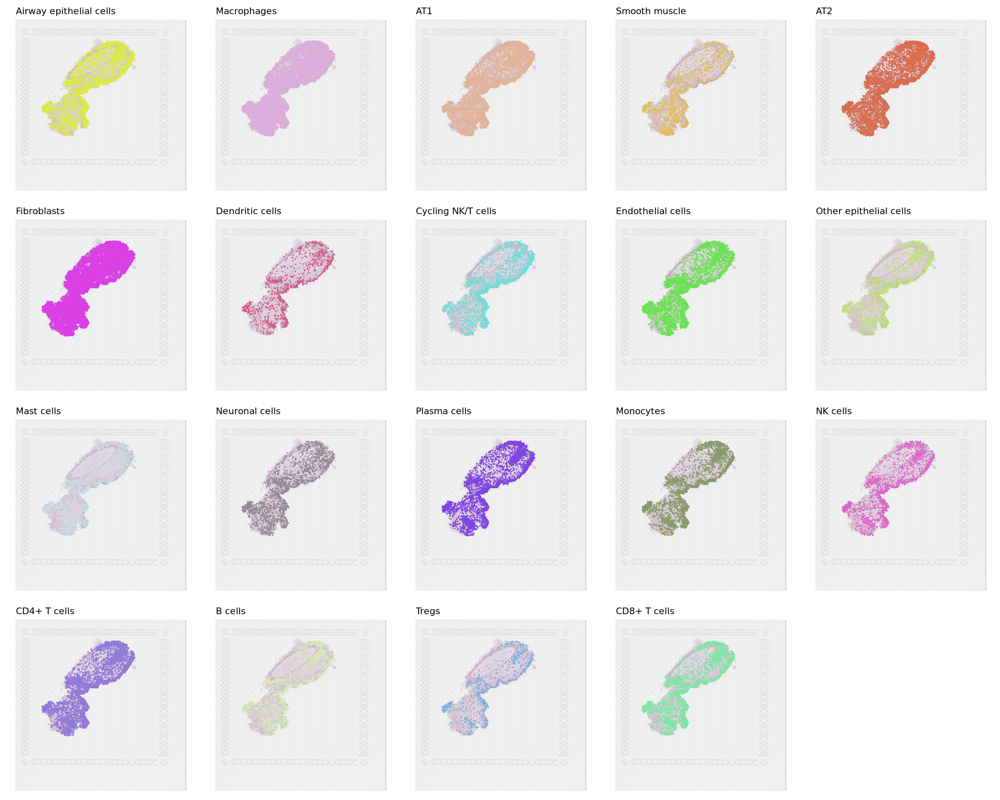

In [280]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'tangram.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for Celltrek

In [43]:
cell.trek <- readRDS('../2.results/COVID19/data/COVID19.celltrek.RDS') %>% { forCellTrek(list(xx = .), brain.sc, brain.st) }

In [299]:
cell.trek <- readRDS(file = file.path(out.data.dir, 'celltrek.reformat.RDS'))

In [282]:
cell.trek@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_RNA,nFeature_RNA,NAME,biosample_id,donor_id,species,species__ontology_label,⋯,pmi_h,id_raw,id_new,coord_x,coord_y,Spot,centerX,centerY,imagerow,imagecol
,<fct>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
GCCTGTTGTGAACCGA-1_1,COVID19,1779,542,1472.888,542,GCCTGTTGTGAACCGA-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,⋯,NA,GCCTGTTGTGAACCGA-1_1,GCCTGTTGTGAACCGA.1_1,806.9749,2287.9688,CTATTGTGTTTGGTCA-1,132.7234,371.0442,130.2974,369.42448
GTGAGGAAGGGAGATA-1_1,COVID19,1827,482,1447.408,482,GTGAGGAAGGGAGATA-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,⋯,NA,GTGAGGAAGGGAGATA-1_1,GTGAGGAAGGGAGATA.1_1,736.1209,2422.6002,TAAATGCCGTCTCATG-1,121.9053,377.3413,118.8570,391.16260
GGCTTTCGTGTCCTAA-1_27,COVID19,1725,374,1167.843,374,GGCTTTCGTGTCCTAA-1_27,L22cov,L22cov,NCBITaxon:9606,Homo sapiens,⋯,6.75,GGCTTTCGTGTCCTAA-1_27,GGCTTTCGTGTCCTAA.1_27,877.7583,2223.5286,CCGCCTGCGAATTGGT-1,143.7029,358.4500,141.7263,359.01971
ACACGCGCACCGCTAG-1_1,COVID19,1958,917,2081.711,917,ACACGCGCACCGCTAG-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,⋯,NA,ACACGCGCACCGCTAG-1_1,ACACGCGCACCGCTAG.1_1,2093.6665,589.0246,CACCCTTGGTGAGACC-1,333.5845,103.1755,338.0517,95.10624
TCTCCGACAATGCAAA-1_6,COVID19,1813,440,1362.141,440,TCTCCGACAATGCAAA-1_6,C56ctr,C56ctr,NCBITaxon:9606,Homo sapiens,⋯,NA,TCTCCGACAATGCAAA-1_6,TCTCCGACAATGCAAA.1_6,1793.8621,633.1463,TGCAGCTACGTACTTC-1,289.8278,103.3369,289.6441,102.23030
CAGGCCAAGCTTCATG-1_1,COVID19,1873,1413,2639.433,1413,CAGGCCAAGCTTCATG-1_1,C51ctr,C51ctr,NCBITaxon:9606,Homo sapiens,⋯,NA,CAGGCCAAGCTTCATG-1_1,CAGGCCAAGCTTCATG.1_1,1982.3760,1163.9327,GGGATGGTCGTAACCG-1,317.5996,187.9440,320.0823,187.93317


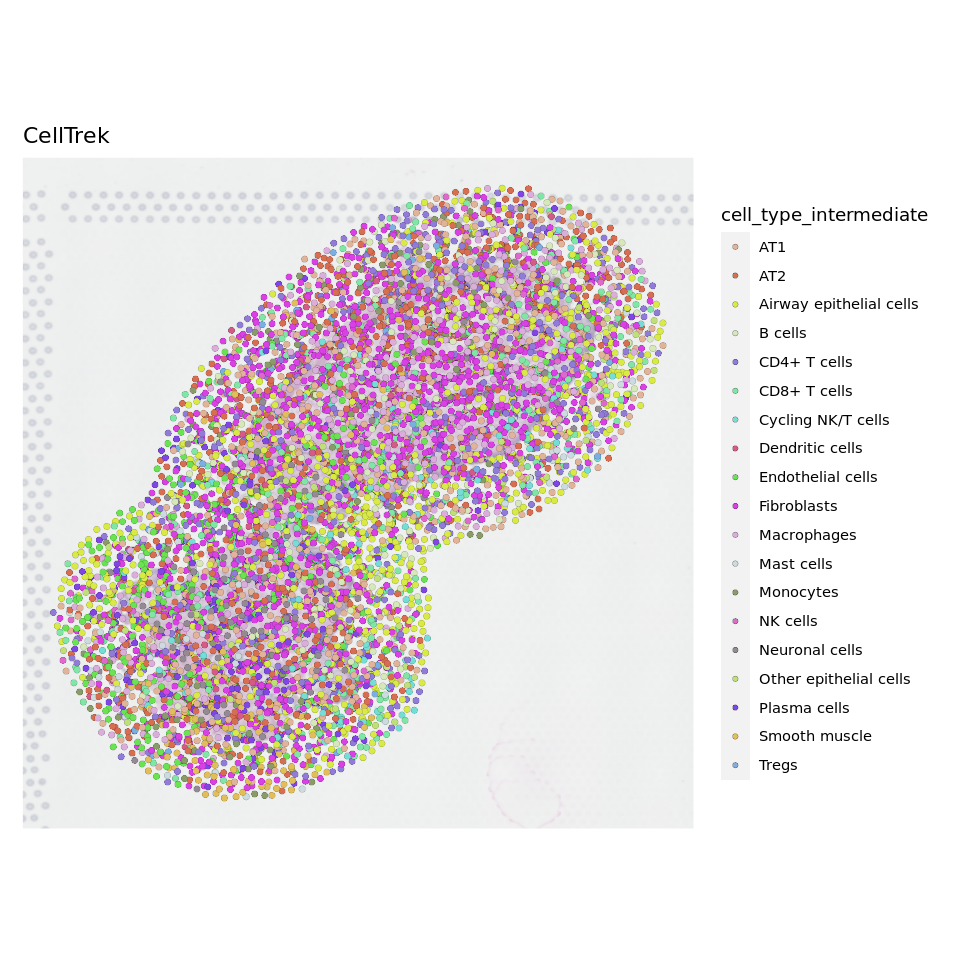

In [283]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(cell.trek, group.by = 'cell_type_intermediate', pt.size = 1.2, image.alpha = 0.5, cols = cell.colors, stroke = 0.1) + ggtitle('CellTrek')
ggsave(file.path(out.figs.dir, 'celltrek.entire.UMAP.pdf'), width = 8, height = 6)

In [284]:
length(f.ctypes <- cell.trek$cell_type_intermediate %>% unique)

[1] 19

In [285]:
f.ctypes <- cell.trek$cell_type_intermediate %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(cell.trek, cell_type_intermediate == ct) %>% Cells
    obj.sub <- cell.trek[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'cell_type_intermediate', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

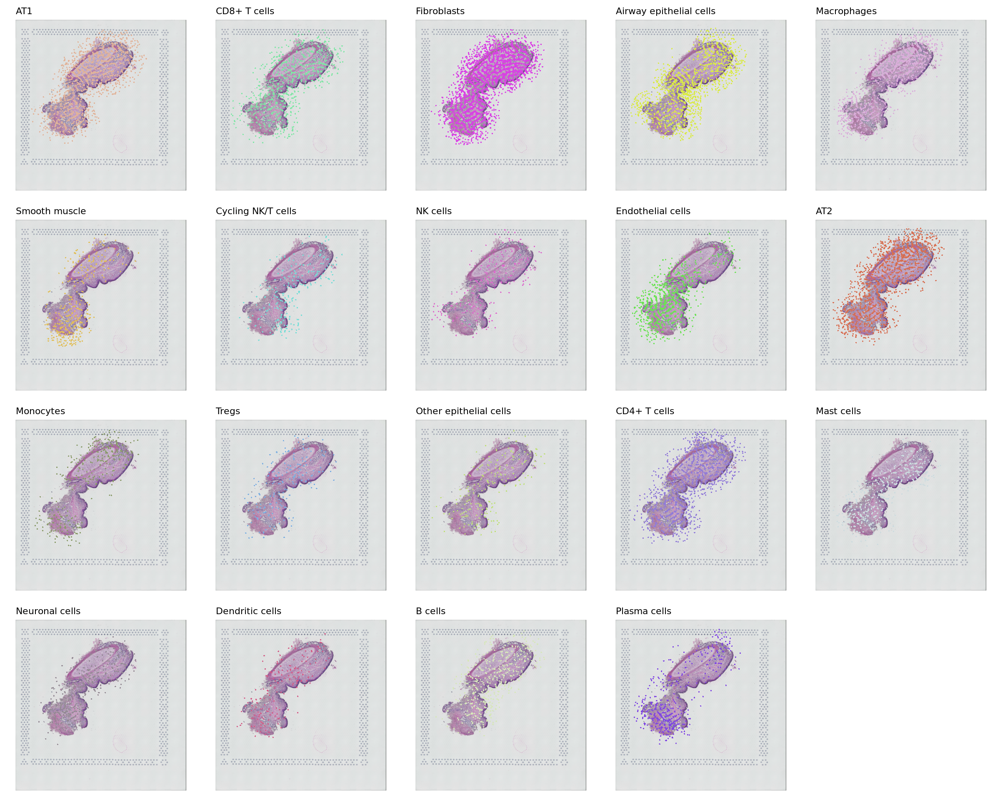

In [286]:
options(repr.plot.width = 20, repr.plot.height = 16)
ggarrange(plotlist = gps, nrow = 4, ncol = 5)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.pdf'), width = 20, height = 16)
ggsave(file.path(out.figs.dir, 'celltrek.split.UMAP.eps'), width = 20, height = 16)

### Showing the projection performance for Seurat

In [300]:
seurat.res <- readRDS('../2.results/COVID19/data/COVID19.seurat.RDS') 

In [288]:
seurat.res@meta.data %>% head

,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT,predicted.id,prediction.score.Airway.epithelial.cells,prediction.score.Macrophages,prediction.score.AT1,prediction.score.Smooth.muscle,⋯,prediction.score.Mast.cells,prediction.score.Neuronal.cells,prediction.score.Plasma.cells,prediction.score.Monocytes,prediction.score.NK.cells,prediction.score.CD4..T.cells,prediction.score.B.cells,prediction.score.Tregs,prediction.score.CD8..T.cells,prediction.score.max
,<fct>,<dbl>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAGAGCGACTCCT-1,SeuratProject,4567,2265,4493,2258,Macrophages,0.09066123,0.46199672,0.00000000,0.01290796,⋯,0,0.00000000,0.01830170,0,0,0,0.000000000,0,0,0.4619967
AAACAGGGTCTATATT-1,SeuratProject,47816,6792,4950,1417,AT2,0.16939616,0.08792774,0.11416844,0.00000000,⋯,0,0.00000000,0.11459127,0,0,0,0.004529633,0,0,0.4273900
AAACCGGGTAGGTACC-1,SeuratProject,5088,2418,4767,2393,Macrophages,0.01121355,0.76189818,0.00000000,0.00000000,⋯,0,0.00000000,0.00000000,0,0,0,0.000000000,0,0,0.7618982
AAACCGTTCGTCCAGG-1,SeuratProject,6143,2743,5175,2735,Macrophages,0.00000000,0.46736532,0.06946678,0.11889583,⋯,0,0.08012252,0.01480835,0,0,0,0.000000000,0,0,0.4673653
AAACTTGCAAACGTAT-1,SeuratProject,6093,2189,5027,2183,AT2,0.10893769,0.04615906,0.12211967,0.00000000,⋯,0,0.00000000,0.04703599,0,0,0,0.000000000,0,0,0.4825499
AAAGGCTCTCGCGCCG-1,SeuratProject,17169,5699,4933,2542,Macrophages,0.09202007,0.86770378,0.00000000,0.00000000,⋯,0,0.00000000,0.00000000,0,0,0,0.000000000,0,0,0.8677038


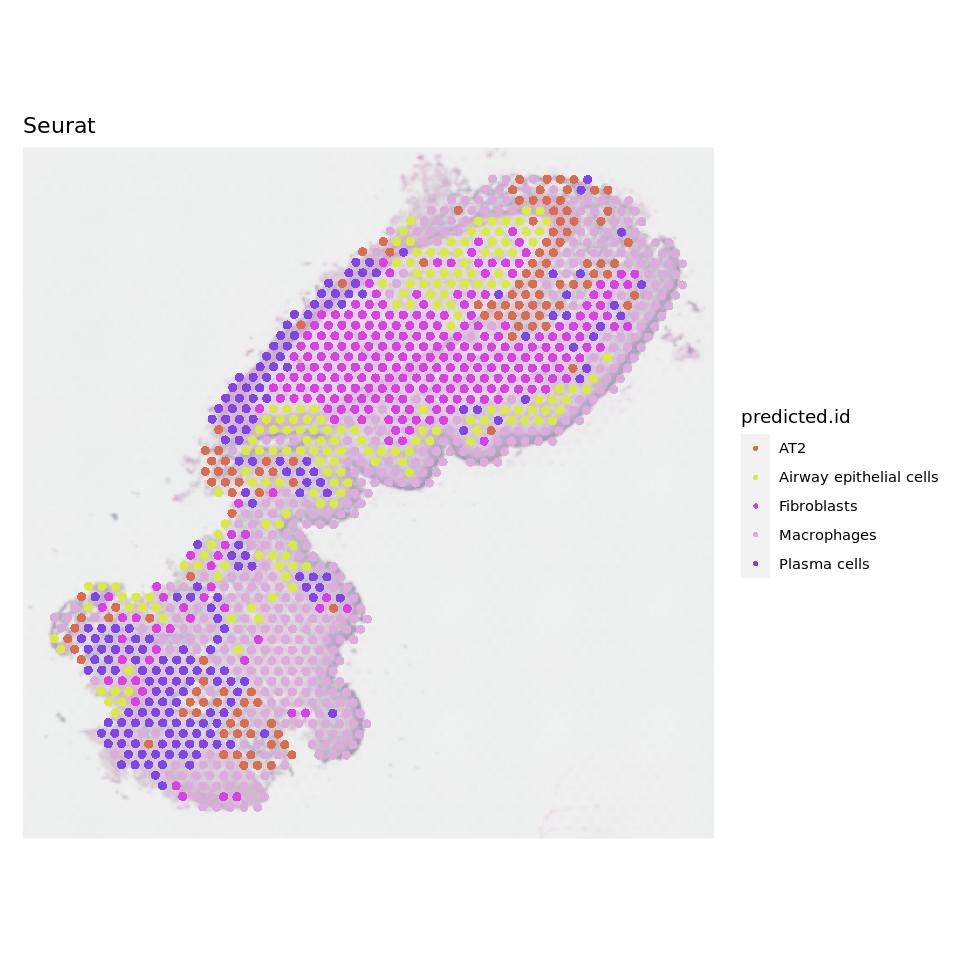

In [289]:
options(repr.plot.width = 8, repr.plot.height = 8)
SpatialPlot(seurat.res, group.by = 'predicted.id', pt.size = 1.6, image.alpha = 0.5, cols = cell.colors, stroke = 0) + ggtitle('Seurat')
ggsave(file.path(out.figs.dir, 'seurat.entire.UMAP.pdf'), width = 8, height = 6)

In [290]:
length(f.ctypes <- seurat.res$predicted.id %>% unique)

[1] 5

In [291]:
f.ctypes <- seurat.res$predicted.id %>% unique
gps <- lapply(f.ctypes, function(ct) {
    h.cells <- subset(seurat.res, predicted.id == ct) %>% Cells
    obj.sub <- seurat.res[, h.cells]
    SpatialDimPlot(obj.sub, image.alpha = 1, group.by = 'predicted.id', cols = cell.colors[ct], pt.size.factor = 1, crop = FALSE, stroke = 0) + ggtitle(ct) + NoLegend()  
})

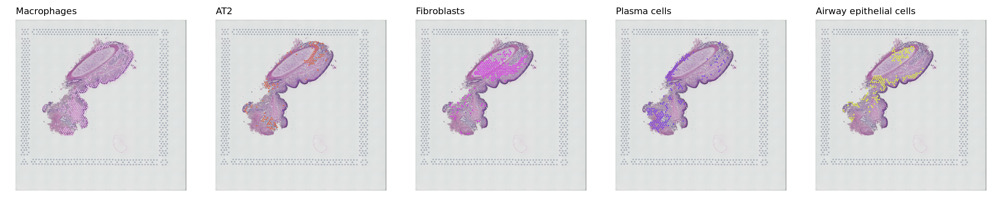

In [292]:
options(repr.plot.width = 20, repr.plot.height = 4)
ggarrange(plotlist = gps, nrow = 1, ncol = 5)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.pdf'), width = 12, height = 4)
ggsave(file.path(out.figs.dir, 'seurat.split.UMAP.eps'), width = 12, height = 4)

### Comparison of the performace based on cellular compositions, take CARD deconvolution results as standard

In [306]:
brain.sc$cluster <- factor(brain.sc$cell_type_intermediate, levels = unique(brain.sc$cell_type_intermediate))

In [336]:
card.res <- readRDS('../2.results/COVID19/data/COVID19.card.RDS')$decon

In [337]:
prop.card <- card.res@Proportion_CARD * 10
prop.card <- apply(prop.card, 1, ceiling) %>% t

In [338]:
prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.card <- colSums(prop.card) / sum(prop.card) * 100
prop.card <- prop.card[names(prop)]

In [339]:
prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cell2spatial <- cell2spatial$CellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cell2spatial)] <- prop.cell2spatial
prop.cell2spatial <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cytospace <- cytospace$CellType %>% table %>% {./sum(.)} * 100
prop[names(prop.cytospace)] <- prop.cytospace
prop.cytospace <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.cell.trek <- cell.trek$cell_type_intermediate %>% table %>% {./sum(.)} * 100
prop[names(prop.cell.trek)] <- prop.cell.trek
prop.cell.trek <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.tangram <- tangram$cell_type_intermediate %>% table %>% {./sum(.)} * 100
prop[intersect(names(prop.tangram), names(prop))] <- prop.tangram[intersect(names(prop.tangram), names(prop))]
prop.tangram <- prop

prop <- rep(0, length(levels(brain.sc$cluster))) %>% `names<-`(levels(brain.sc$cluster))
prop.seurat <- seurat.res$predicted.id %>% table %>% {./sum(.)} * 100
prop[names(prop.seurat)] <- prop.seurat
prop.seurat <- prop

In [340]:
#xx.new <- readRDS('../0.data/Thymus.Suo/thymus.sc.park.backup.RDS')

In [341]:
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'B_pro/pre'] <- 'B_pro.pre'
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'CD8αα'] <- 'CD8AA'
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'TEC(neuro)'] <- 'TEC'
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'TEC(myo)'] <- 'TEC'
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'T(agonist)'] <- 'T.agonist'
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'αβT(entry)'] <- 'ABT.entry'
#xx.new$CellTypeNew[xx.new$CellTypeNew == 'γδT'] <- 'gdT.entry'

In [342]:
#xx.prop <- table(xx.new$CellTypeNew) / sum(table(xx.new$CellTypeNew)) * 100
#prop.card[names(xx.prop)] <- xx.prop

In [343]:
prop.df <- cbind.data.frame(CARD = prop.card, Cell2Spatial = prop.cell2spatial, CytoSPACE = prop.cytospace, CellTrek = prop.cell.trek, Tangram = prop.tangram, Seurat = prop.seurat)

In [344]:
openxlsx::write.xlsx(prop.df, file = file.path(out.data.dir, 'methods.corr.vs.card.xlsx'))

In [345]:
prop.df$CellType <- rownames(prop.df)
gps <- lapply(colnames(prop.df)[2 : (ncol(prop.df) - 1)], function(meth) {
    plot.df.sub <- prop.df[, c('CARD', meth, 'CellType')] %>% `colnames<-`(c('CARD', 'Y', 'CellType'))
    ggplot(plot.df.sub, aes(x = CARD, y = Y)) + geom_point(size = 4, aes(color = CellType)) + theme_classic() + 
        geom_smooth(method = lm, se = TRUE) + ylab(meth) + ggpubr::stat_cor(method = "pearson") + scale_color_manual(values = cell.colors)
})

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


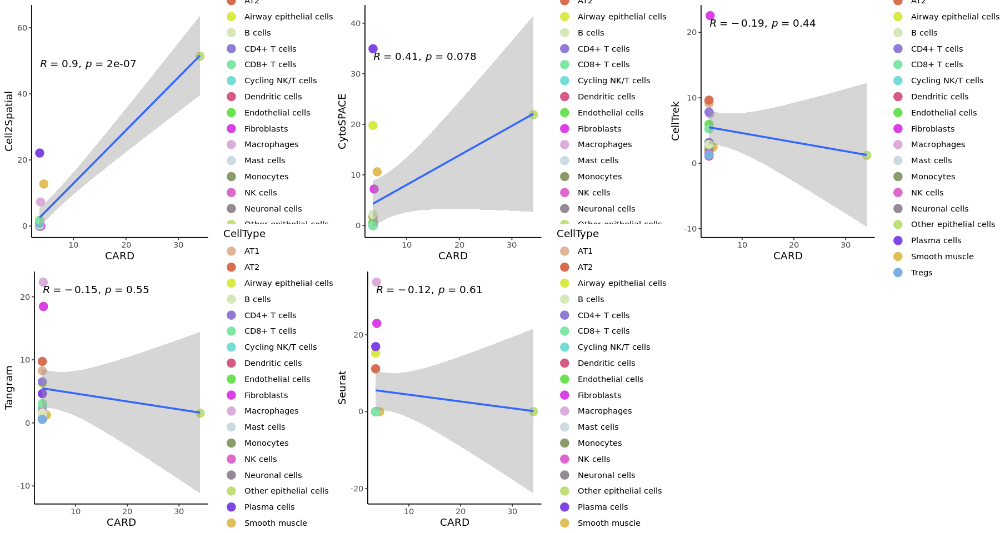

In [346]:
options(repr.plot.width = 15, repr.plot.height = 8)
ggarrange(plotlist = gps, nrow = 2, ncol = 3)
ggsave(file.path(out.figs.dir, 'methods.corr.vs.card.pdf'), width = 15, height = 8)

### Enrichment score analysis

In [190]:
markers.sc <- FindAllMarkers(brain.sc, only.pos = TRUE, logfc.threshold = 0.25, min.pct = 0.25, assay = 'SCT')

Calculating cluster Airway epithelial cells

Calculating cluster Macrophages

Calculating cluster AT1

Calculating cluster Smooth muscle

Calculating cluster AT2

Calculating cluster Fibroblasts

Calculating cluster Dendritic cells

Calculating cluster Cycling NK/T cells

Calculating cluster Endothelial cells

Calculating cluster Other epithelial cells

Calculating cluster Mast cells

Calculating cluster Neuronal cells

Calculating cluster Plasma cells

Calculating cluster Monocytes

Calculating cluster NK cells

Calculating cluster CD4+ T cells

Calculating cluster B cells

Calculating cluster Tregs

Calculating cluster CD8+ T cells



In [70]:
top20.markers.sc <- markers.sc %>% group_by(cluster) %>% top_n(n = 30, wt = avg_log2FC)

In [71]:
brain.st <- AddModuleScore(brain.st, features = split(top20.markers.sc$gene, top20.markers.sc$cluster))
marker.lust <- split(top20.markers.sc$gene, top20.markers.sc$cluster)

In [72]:
avgDist <- function(obj, brain.st, ctype, p.cut = 0.05) {
    res <- lapply(1 : length(names(marker.lust)), function(idx) {
        cell.name <- names(marker.lust)[idx]
        scores <- brain.st@meta.data[, paste0('Cluster', idx)] %>% `names<-`(rownames(brain.st@meta.data))
        pvals <- pnorm(scores, mean = mean(scores), sd = sd(scores), lower.tail = FALSE)
        spots <- pvals[pvals < p.cut] %>% names
        if (length(spots) == 0) return(0)
        if (!(cell.name %in% unique(obj@meta.data[, ctype]))) return(0)
        if (sum(spots %in% obj$SpotName) == 0) return(0)
        xx <- obj
        if (!(cell.name %in% unique(xx@meta.data[, ctype]))) return(0)
        xx <- table(xx$SpotName, xx@meta.data[, ctype])
        pre <- rownames(xx)[which(xx[, cell.name] > 0)]
        length(intersect(spots, pre)) / length(union(spots, pre)) * 100
    }) %>% unlist(.) %>% as.vector %>% mean
}

In [147]:
xx.1 <- avgDist(cell2spatial, brain.st, 'CellType', p.cut = p.cut)
print(xx.1)

[1] 8.784542


In [148]:
cytospace$SpotName <- cytospace$SpotID 
xx.2 <- avgDist(cytospace, brain.st, 'CellType', p.cut = p.cut)
print(xx.2)

[1] 8.363631


In [149]:
cell.trek$SpotName <- cell.trek$Spot 
xx.3 <- avgDist(cell.trek, brain.st, 'cell_type_intermediate', p.cut = p.cut)
print(xx.3)

[1] 6.477704


In [150]:
tangram$SpotName <- tangram$SpotID
xx.4 <- avgDist(tangram, brain.st, 'cell_type_intermediate', p.cut = p.cut)
print(xx.4)

[1] 7.392271


In [151]:
seurat.res$SpotName <- rownames(seurat.res@meta.data)
xx.5 <- avgDist(seurat.res, brain.st, 'predicted.id', p.cut = p.cut)
print(xx.5)

[1] 2.934297


In [152]:
plot.df <- cbind.data.frame(Index = c(xx.1, xx.2, xx.3, xx.4, xx.5), Method = c('Cell2Spatial', 'CytoSPACE', 'CellTrek', 'Tangram', 'Seurat'), Data = 'DLPFC')

In [153]:
openxlsx::write.xlsx(plot.df, file = file.path(out.data.dir, 'COVID19.acc.xlsx'))

### Number of cell types projected

In [347]:
number.cts <- c(
    Reference = length(cell.colors),
    Cell2Spatial = unique(cell2spatial$CellType) %>% length, 
    CytoSPACE = unique(cytospace$CellType) %>% length, 
    CellTrek = unique(cell.trek$cell_type_intermediate) %>% length, 
    Tangram = unique(tangram$cell_type_intermediate) %>% length, 
    Seurat = unique(seurat.res$predicted.id) %>% length    
)
number.cts

Reference Cell2Spatial    CytoSPACE     CellTrek      Tangram       Seurat 
          19           14           12           19           19            5

png 
  2

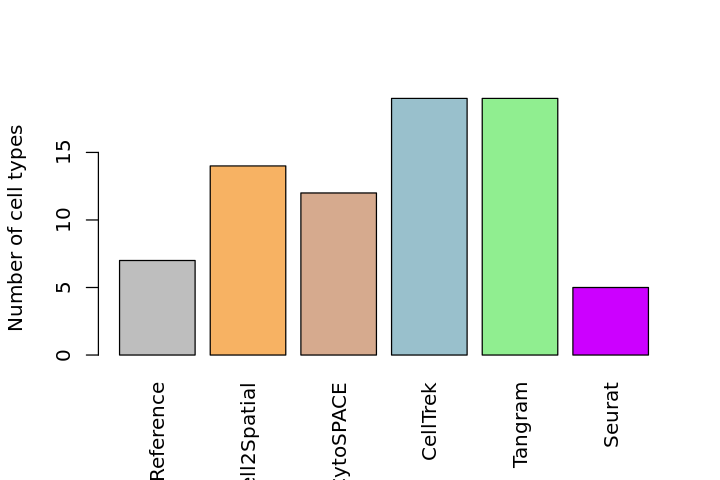

In [193]:
options(repr.plot.width = 6, repr.plot.height = 4)

pdf(file.path(out.figs.dir, 'number.of.ctypes.pdf'), width = 6, height = 4)
bp <- barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)
text(bp, 20, labels = round(number.cts, digits = 2))

dev.off()
barplot(number.cts, las = 3, ylab = 'Number of cell types', col = MTH_COLOR)

In [194]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 22.04.2 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/blas/libblas.so.3.10.0
LAPACK: /usr/lib/x86_64-linux-gnu/lapack/liblapack.so.3.10.0

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] Cell2Spatial_1.0.0  CARD_1.1            Biobase_2.54.0     
 [4] BiocGenerics_0.40.0 CellTrek_0.0.94     tidydr_0.0.5       
 [7] ggpubr_0.6.0        stringr_1.5.0       reticulate_1.30    
[10] dplyr_1.1.2         ggplot2_3.4.2       SeuratObject_4.1.3 
[13] Seurat_4.3.0.1     

loaded via a namespace (and not attached):
  [1] SparseM_1.81             